In [1]:
import numpy as np
import pandas as pd
import math as m
import matplotlib.pyplot as plt
import warnings
import scipy
from sklearn.decomposition import PCA


from visuals import *
from my_lib import *

In [412]:
warnings.simplefilter('ignore')

plt.rcParams['figure.figsize'] = 10, 10
plt.rcParams['font.family'] = 'DejaVu Serif'
plt.rcParams['lines.linewidth'] = 2
plt.rcParams['lines.markersize'] = 8
plt.rcParams['xtick.labelsize'] = 16
plt.rcParams['ytick.labelsize'] = 16
plt.rcParams['legend.fontsize'] = 16
plt.rcParams['axes.titlesize'] = 24
plt.rcParams['axes.labelsize'] = 8

In [3]:
def CartesianToSpherical(point):
    r = np.sqrt(sum(point ** 2))
    n = len(point)
    phi = np.zeros(n - 1)
    
    for i in range(n - 2):
        phi[i] = np.arccos(point[i] / np.sqrt(sum(point[i:] ** 2)))
        
    if point[-1] >= 0:
        phi[n - 2] = np.arccos(point[n - 2] / np.sqrt(point[n - 1] ** 2 + point[n - 2] ** 2))
    else:
        phi[n - 2] = 2 * np.pi - np.arccos(point[n - 2] / np.sqrt(point[n - 1] ** 2 + point[n - 2] ** 2))
        
    return np.hstack((phi, r))


def TrajectoryToSpherical(tr):
    tr_spherical = np.zeros(tr.shape)
    for i, point in enumerate(tr):
        tr_spherical[i] = CartesianToSpherical(point)
    return tr_spherical


def SphericalToCartesian(point):
    phi, r = point[:-1], point[-1]
    n = len(point)
    x = np.zeros(n) 
    cur = r
    
    for i in range(n - 1):
        x[i] = cur * np.cos(phi[i])
        cur *= np.sin(phi[i])

    x[n - 1] = cur
    return x
    

def TrajectoryToCartesian(tr):
    tr_cartesian = np.zeros(tr.shape)
    for i, point in enumerate(tr):
        tr_cartesian[i] = SphericalToCartesian(point)
    return tr_cartesian

In [4]:
def orientation(point, n, point0, dist=False):
    ans = 0
    for i in range(len(n)):
        ans += n[i]*(point[i] - point0[i])
    if dist:
        return ans/(np.sum(n**2))**.5
        
    else:
        return np.sign(ans)

def HankelMatrix(X, L):  
    N = X.shape[0]
    return scipy.linalg.hankel(X[ : N - L + 1], X[N - L : N])

def prepare_time_series(_dir, centred = True):
    data = pd.read_csv(_dir, delimiter =';', decimal=',')
    
    frequency = len(data)/(data['time'].values[-1]-data['time'].values[0])
    
    assert 490 < frequency < 510, f'Bad frequency {frequency}'

    _x = ( (data['X_value'].values)**2 + (data['Y_value'].values)**2 + (data['Z_value'].values)**2)**.5
    
    if centred:
        _m = np.mean(_x)
        _x = (_x-_m)
        
    _t = (data['time'].values).astype(float).reshape([-1,])

    _t = np.linspace(0,_t[-1]-_t[0],len(_x))
        
    return _x,_t

# Алгоритм с использованием средней фазовой траетории

In [5]:
x_acc_test, t_test = prepare_time_series('./data/30 sec 2_accm.csv')

x_acc, t = prepare_time_series('./data/long_walk_100_acc.csv')

dt = 450*20
x_acc = x_acc[7007:7007+dt]
fig = go.Figure()
fig.add_scatter(y = x_acc, mode='lines', name='x_acc')
fig.show()

In [6]:
x_acc_test_ = x_acc_test[:25000]*0.8

In [7]:
modif = np.concatenate([np.ones(3000),
                        np.linspace(1,0,500),
                        np.zeros(1500)+.2,
                        np.linspace(0,1,1000),
                        np.ones(6000),
                        np.linspace(1,0,400),
                        np.zeros(4000)+.2,
                        np.linspace(0,1,1000)],
                        axis = 0)

In [8]:
modif = np.concatenate([modif,
                       np.ones(len(x_acc_test_)-len(modif))],
                       axis = 0)

In [9]:
x_acc_test_m = x_acc_test_ *0.8 * modif
fig = go.Figure()
fig.add_scatter(y = x_acc_test_m, mode='lines', name='x_acc')
fig.show()

In [629]:
X = HankelMatrix(x_acc,500)
X_test = HankelMatrix(x_acc_test_m,500)

pca = PCA(n_components = 3)
X_PCA = pca.fit_transform(X)
X_PCA_test = pca.transform(X_test)

In [630]:
####################################################
X_mean = X_PCA[:460]
for i in range(1,18):
    X_mean += X_PCA[460*i:460*(i+1)]
X_mean /= 18

####################################################
X_std = (X_PCA[:460] - X_mean)**2
for i in range(1,18):
    X_std += (X_PCA[460*i:460*(i+1)] - X_mean)**2
X_std = (X_std/18)**.5

D = 3*X_std.mean()

In [631]:
phase_index = 6060-500
Point_zero_phase = X_PCA[phase_index]
Point_half_phase = X_PCA[phase_index + 230]

In [632]:
a = X_PCA[phase_index+1]
b = X_PCA[phase_index-1]
n = (b-a)

In [633]:
r = np.array([a + 0*(b-a)])

for t_param in np.linspace(-50,50,200):
    
    _r = np.array([a + t_param*(b-a)])
    
    r = np.concatenate([r,_r], axis = 0)

In [634]:
indexes = []
for i in range(1,len(X_PCA_test)):
    if (np.sum((Point_zero_phase - X_PCA_test[i])**2))**.5 <= D:
        if orientation(X_PCA_test[i-1],n, Point_zero_phase) != orientation(X_PCA_test[i],n, Point_zero_phase):
            indexes.append(i)
indexes = np.array(indexes)

In [635]:
fig = go.Figure()

fig.update_layout( autosize=False, width=950, height=500)

fig.add_scatter(y = x_acc_test_m,x = np.arange(len(x_acc_test_m)), mode='lines', name='X_PCA',opacity=0.5)

indexes_init = indexes + 500
fig.add_scatter(y = x_acc_test_m[indexes_init],
                x = indexes_init, 
                mode='markers',
                marker_size=10)

fig.show()

### Без ограничения на дисперсию

In [290]:
indexes = []
for i in range(1,len(X_PCA)):
    if (np.sum((Point_zero_phase - X_PCA[i])**2))**.5 <= np.inf:
        if orientation(X_PCA[i-1],n, Point_zero_phase) != orientation(X_PCA[i],n, Point_zero_phase):
            indexes.append(i)
indexes = np.array(indexes)

In [69]:
fig = go.Figure()

fig.update_layout( autosize=False, width=950, height=500)

fig.add_scatter(y = x_acc,x = np.arange(len(x_acc)), mode='lines', name='X_PCA',opacity=0.5)

indexes_init = indexes + 500
fig.add_scatter(y = x_acc[indexes_init],
                x = indexes_init, 
                mode='markers',
                marker_size=10)

fig.show()

In [291]:
if X_PCA.shape[1] ==3:
    p_1, p_2 = np.mgrid[0:np.pi:100j, 0:2*np.pi:100j]

    x_s = Point_zero_phase[0] + D*np.sin(p_1)*np.cos(p_2)
    y_s = Point_zero_phase[1] + D*np.sin(p_1)*np.sin(p_2)
    z_s = Point_zero_phase[2] + D*np.cos(p_1)

    fig_2 = go.Figure()
    fig_2.update_layout(autosize=False, width=1000, height=1000)

    fig_2.add_trace(go.Scatter3d(x=X_PCA[:,0],
                                 y=X_PCA[:,1],
                                 z=X_PCA[:,2],
                                 marker=dict(size=0.1,line=dict(width=0.01)),
                                 name = False
                                )
                    )

    fig_2.add_trace(go.Scatter3d(x=X_mean[:,0],
                                 y=X_mean[:,1],
                                 z=X_mean[:,2],
                                 marker=dict(size=0.1,line=dict(width=0.01)),
                                )
                    )

    fig_2.add_trace(go.Surface(x=x_s,
                               y=y_s,
                               z=z_s,
                               showscale=False,
                               opacity=0.2,
                               surfacecolor = np.linspace(0,100,len(x_s))))

    fig_2.add_trace(go.Scatter3d(x=X_PCA_test[:,0],
                                 y=X_PCA_test[:,1],
                                 z=X_PCA_test[:,2],
                                 marker=dict(size=0.1,line=dict(width=0.01)),
                                )
                    )

    fig_2.add_trace(go.Scatter3d(x=[Point_zero_phase[0]],
                               y=[Point_zero_phase[1]],
                               z=[Point_zero_phase[2]],
                               mode='markers',
                               marker_size=10,
                               marker_color='rgba(10, 250, 250, .7)',
                               name='Zero point'))

    fig_2.add_trace(go.Scatter3d(x=[Point_half_phase[0]],
                               y=[Point_half_phase[1]],
                               z=[Point_half_phase[2]],
                               mode='markers',
                               marker_size=10,
                               marker_color='rgba(10, 250, 250, .7)',
                               name='Half point'))

    fig_2.add_trace(go.Scatter3d(x=r[:,0],
                               y=r[:,1],
                               z=r[:,2],
                               marker=dict(size=0.1,line=dict(width=0.1))))


    fig_2.layout.template = 'plotly_white'
    fig_2.show()

# Алгоритм на чистых данных (модификация Мотренко)

In [48]:
x_acc, t = prepare_time_series('./data/long_walk_100_acc.csv')
dt = 450*20
x_acc = x_acc[7007:7007+dt]

In [49]:
X = HankelMatrix(x_acc,500)
fig = go.Figure()
fig.add_scatter(y = x_acc, mode='lines', name='x_acc')
fig.show()

In [638]:
X = HankelMatrix(x_acc,500)
pca = PCA(n_components = 10)
X_PCA = pca.fit_transform(X)

In [639]:
#точка на фазовой траектории
index_0 = 6060-500
phi_0 = X_PCA[index_0]

#направляющий вектор прямой из центра в точку фазовой траектории
n_ph = phi_0 - 0

In [640]:
#находим направляющий вектор для касательной и точку для проекции на этой прямой
a = X_PCA[index_0+1]
b = X_PCA[index_0-1]
n = (b-a)
point_for_projection = a + n*(-10)

In [641]:
# Находим плоскоть перпендикулярную прямой из центра и проходящуую через point_for_projection
# Получем уравнение вида n_ph[0]*(x[0] - point_for_projection[0]) + ... = 0
# Получем уравнение прямой из центра координат в параметрической (относительно параметра t) виде
#         x[0] = 0 + n_ph[0] * t
# Подставляем в уравнение  плоскости n_ph[0]*(n_ph[0]*t - point_for_projection[0]) + ... = 0
# Находим t 
t = np.sum(n_ph * point_for_projection)/np.sum(n_ph**2)

projection_point = n_ph * t

In [642]:
# Проверка на 3мерном случае 
if X_PCA.shape[1] ==3:
    fig_2 = go.Figure()
    fig_2.update_layout(autosize=False, width=800, height=800)
    fig_2.add_trace(go.Scatter3d(x=X_PCA[:,0],
                                 y=X_PCA[:,1],
                                 z=X_PCA[:,2],
                                 marker=dict(size=0.1,line=dict(width=0.01)),
                                 name = False))
    fig_2.add_trace(go.Scatter3d(x=[projection_point[0]],
                               y=[projection_point[1]],
                               z=[projection_point[2]],
                               mode='markers',
                               marker_size=10,
                               marker_color='rgba(10, 250, 250, .7)',
                               name='projection_point'))
    fig_2.layout.template = 'plotly_white'
    fig_2.show()

In [643]:
# получем ветор нормальи для итоговой плоскости
n_final = projection_point - point_for_projection
# Предел по расстоянию (ближе чем середина между максимальный расстоянием между 2мя точакми на таректории)
limit = np.sum(np.abs((np.max(X_PCA,axis = 0) - np.min(X_PCA,axis = 0))))/3.5

In [644]:
####################################################
X_mean = X_PCA[:460]
for i in range(1,18):
    X_mean += X_PCA[460*i:460*(i+1)]
X_mean /= 18

####################################################
X_std = (X_PCA[:460] - X_mean)**2
for i in range(1,18):
    X_std += (X_PCA[460*i:460*(i+1)] - X_mean)**2
X_std = (X_std/18)**.5

D = 2*X_std.mean()

In [645]:
print(f"D:{np.round(D,3)}, Limit:{np.round(limit,3)}")

D:19.421, Limit:317.233


In [650]:
indexes = []
for i in range(1,len(X_PCA)):
    if np.sum(np.abs(phi_0 - X_PCA[i])) <= np.inf:
        if orientation(X_PCA[i-1],n_final, np.zeros(len(phi_0))) != orientation(X_PCA[i],n_final, np.zeros(len(phi_0))):
            indexes.append(i)
indexes = np.array(indexes[:-2])

In [651]:
indexes

array([  37,  135,  250,  400,  490,  587,  703,  849,  948, 1045, 1155,
       1256, 1272, 1310, 1406, 1504, 1612, 1765, 1864, 1963, 2076, 2231,
       2330, 2425, 2545, 2693, 2791, 2888, 3003, 3155, 3253, 3353, 3468,
       3571, 3588, 3620, 3718, 3815, 3922, 4083, 4181, 4276, 4386, 4539,
       4635, 4733, 4854, 5003, 5100, 5200, 5313, 5414, 5429, 5465, 5560,
       5657, 5776, 5926, 6023, 6120, 6233, 6339, 6345, 6385, 6483, 6581,
       6698, 6804, 6808, 6851, 6948, 7044, 7166, 7316, 7412, 7511, 7625,
       7777, 7874, 7969, 8082, 8185, 8195, 8236])

In [652]:
# Проверка на 3мерном случае 
if X_PCA.shape[1] ==3:
    fig_2 = go.Figure()
    fig_2.update_layout(autosize=False, width=800, height=800)
    fig_2.add_trace(go.Scatter3d(x=X_PCA[:,0],
                                 y=X_PCA[:,1],
                                 z=X_PCA[:,2],
                                 marker=dict(size=0.1,line=dict(width=0.01)),
                                 name = False))
#     fig_2.add_trace(go.Scatter3d(x=[projection_point[0]],
#                                y=[projection_point[1]],
#                                z=[projection_point[2]],
#                                mode='markers',
#                                marker_size=10,
#                                marker_color='rgba(10, 250, 250, .7)',
#                                name='projection_point'))
    fig_2.add_trace(go.Scatter3d(x=X_PCA[indexes,0],
                                 y=X_PCA[indexes,1],
                                 z=X_PCA[indexes,2],
                               mode='markers',
                               marker_size=10,
                               marker_color='rgba(10, 250, 250, .7)',
                               name='Results'))
    fig_2.layout.template = 'plotly_white'
    fig_2.show()

In [653]:
fig = go.Figure()

fig.update_layout( autosize=False, width=950, height=500)
fig.add_scatter(y = x_acc,
                x = np.arange(len(x_acc)),
                mode='lines',
                name='X_PCA',
                opacity=0.5)
indexes_init = indexes + 500
fig.add_scatter(y = x_acc[indexes_init],
                x = indexes_init, 
                mode='markers',
                marker_size=10)
fig.show()

In [595]:
np.mean(np.diff(indexes_init))

93.3875968992248

In [554]:
np.std(np.diff(indexes_init))

91.43364111006188

In [555]:
from statsmodels.tsa.stattools import acf
from statsmodels.graphics.tsaplots import plot_acf

In [636]:
acf_x = acf(
        x_acc_test_m,
        nlags=len(x_acc_test_m)-3000,
        alpha=0.5,
)

fig = go.Figure()
fig.add_scatter(x = np.arange(len(acf_x[0])),
                y = acf_x[0], mode='lines', name='ACF')
fig.show()

In [557]:
from scipy.signal import find_peaks

In [560]:
scipy.signal.find_peaks(acf_x[0])[0][2:]

array([ 692,  922, 1155, 1385, 1620, 1847, 2077, 2309, 2537, 2770, 3000,
       3231, 3459, 3692, 3925, 4153, 4392, 4615, 4854, 5078, 5310, 5540,
       5768])

In [575]:
indexes_init[:-14]

array([ 706,  939, 1157, 1388, 1615, 1848, 2071, 2307, 2522, 2769, 2971,
       3229, 3445, 3447, 3459, 3692, 3914, 4158, 4357, 4623, 4861, 5078,
       5314, 5539])

In [483]:
temp = np.array([938-460])

temp = np.concatenate((temp,indexes_init))

temp

array([ 478,  938, 1388, 1847, 2306, 2768, 3229, 3691, 4156, 4623, 5078,
       5538, 6001, 6463, 6922, 7388, 7853, 8315, 8776])

In [447]:
np.diff(temp)

array([460, 450, 459, 459, 462, 461, 462, 465, 467, 455, 460, 463, 462,
       459, 466, 465, 462, 461])

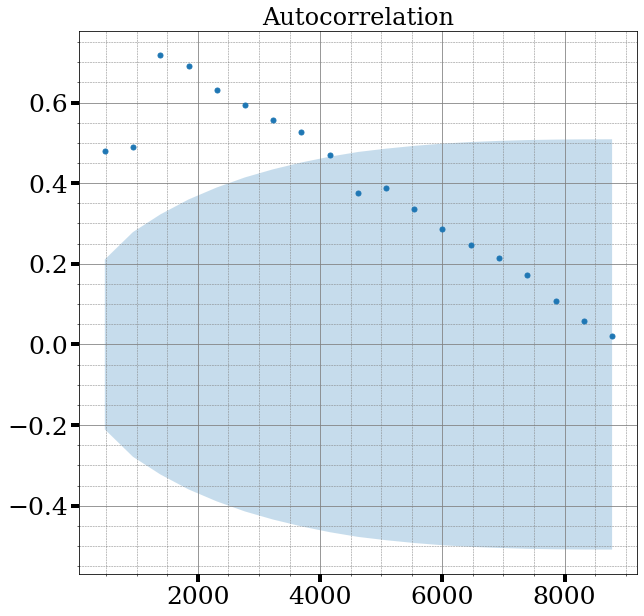

In [446]:
ax = plot_acf(x_acc,
              lags=temp,
              use_vlines = False,
              alpha=0.1
         )
plt.tick_params(axis='both', which='major', labelsize=25,length=8, width=4)
plt.grid(which='major',
    color = 'gray', 
    linewidth = 0.8)
plt.minorticks_on()
plt.grid(which='minor', 
    color = 'gray', 
    linestyle = '--',
    linewidth = 0.5)
plt.show()

In [448]:
acf_x = acf(
        x_acc,
        nlags=temp,
        alpha=0.5,
)

fig = go.Figure()
fig.add_scatter(x = np.arange(len(acf_x[0])),
                y = acf_x[0], mode='lines', name='ACF')
fig.show()

TypeError: nlags must be integer_like (int or np.integer, but not bool or timedelta64) or None

In [451]:
u = indexes_init.copy()
u

array([ 938, 1388, 1847, 2306, 2768, 3229, 3691, 4156, 4623, 5078, 5538,
       6001, 6463, 6922, 7388, 7853, 8315, 8776])

In [460]:
np.diff(indexes_init.copy())

array([450, 459, 459, 462, 461, 462, 465, 467, 455, 460, 463, 462, 459,
       466, 465, 462, 461])

In [462]:
m__ = int(np.median(np.diff(indexes_init.copy())))
m__

462

In [463]:
x_acc_temp = x_acc[938:].copy

In [479]:
m__ = 230

In [481]:
for i in range(1,20):

    corrcoef = np.corrcoef(x_acc[m__*i:m__*(i+1)],x_acc[m__*(i+2):m__*(i+3)])
    print(corrcoef[0][1])

0.8394541475518077
0.939574597440738
0.9408855943463797
0.9563881055072915
0.9010255176372287
0.9497371020731412
0.8498661576011265
0.9631238810088271
0.800254958716907
0.9850918078392144
0.9544601040691837
0.9692039654120949
0.8913595671572724
0.8797804988961356
0.8613275483630161
0.9191236296960893
0.9038677742108168
0.8733638467016948
0.9703275653542415
